In [424]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import matplotlib.mlab as mlab
import scipy.signal
from scipy.ndimage.filters import maximum_filter
import math

%matplotlib inline
from IPython.display import Audio

In [179]:
freq, rec = wavfile.read('data/Arcade Fire - Discography - 2001-2013/Albums (CD Original)/2004 - Funeral - (320 kbps)/01. Neighborhood 1 (Tunnels).wav')

In [180]:
Audio(sample, rate = freq)

In [186]:
spectrogram = get_specgram(sample, chunk_size=4096, overlap_ratio=0.75)

In [374]:
def gaussian_kernel_1d(sigma, kernel_size):
    # your code goes here
    const = 1 / (math.sqrt(2 * math.pi) * sigma)
    kernel = np.empty((kernel_size, 1))
    for i in range(kernel_size):
        x = i - (kernel_size - 1) / 2
        kernel[i,0] = const * math.exp(-x*x/(2*sigma*sigma))
    return kernel.T

In [345]:
def get_2D_peaks_no_filt(spectrogram, amp_min=20, max_neighbors=20):
    struct = generate_binary_structure(2, 1)
    neighborhood = iterate_structure(struct, max_neighbors)
    detected_peaks = (maximum_filter(spectrogram, footprint=neighborhood) == spectrogram) * (spectrogram > amp_min)
    freqs, times = np.where(detected_peaks)

    return freqs, times

In [400]:
def get_2D_peaks_unsharp_mask(spectrogram, k_len=3, kernel='box', amp_min=20, max_neighbors=20, sigma=1):
    double_k = np.zeros((1,k_len))
    double_k[0][k_len//2] = 2
    if kernel=='box':
        sharp_filter = double_k - 1/k_len * np.ones((1,k_len))
    elif kernel=='gauss':
        sharp_filter = double_k - gaussian_kernel_1d(sigma, k_len)
    elif kernel=='gauss_2d':
        double_k = np.zeros((k_len,k_len))
        double_k[k_len//2][k_len//2] = 2
        g = gaussian_kernel_1d(sigma, k_len)
        sharp_filter = double_k - g*g.T
    else:
        raise ValueException('Invalid kernel')
    det = scipy.signal.convolve2d(spectrogram, sharp_filter, mode='same')
    
    struct = generate_binary_structure(2, 1)
    neighborhood = iterate_structure(struct, max_neighbors)
    detected_peaks = (maximum_filter(det, footprint=neighborhood) == det) * (det > amp_min)
    freqs, times = np.where(detected_peaks)

    return freqs, times

In [362]:
def get_2D_peaks_laplacian(spectrogram, c=0.2, amp_min=20, max_neighbors=20):
    det = spectrogram - c *scipy.signal.convolve2d(spectrogram, [[-1, 2, -1]], mode='same')
    
    struct = generate_binary_structure(2, 1)
    neighborhood = iterate_structure(struct, max_neighbors)
    detected_peaks = (maximum_filter(det, footprint=neighborhood) == det) * (det > amp_min)
    freqs, times = np.where(detected_peaks)

    return freqs, times

In [360]:
def get_2D_peaks_laplacian_2d(spectrogram, c=0.2, amp_min=20, max_neighbors=20):
    det = spectrogram - c *scipy.signal.convolve2d(spectrogram, [[0,-1,0],[-1, 2, -1],[0,-1,0]], mode='same')
    
    struct = generate_binary_structure(2, 1)
    neighborhood = iterate_structure(struct, max_neighbors)
    detected_peaks = (maximum_filter(det, footprint=neighborhood) == det) * (det > amp_min)
    freqs, times = np.where(detected_peaks)

    return freqs, times

In [348]:
f_nofilt, t_nofilt = get_2D_peaks_no_filt(spectrogram, amp_min=10)

In [357]:
f_lapl, t_lapl = get_2D_peaks_laplacian(spectrogram, c=0.2, amp_min=12)

In [363]:
f_lapl_2, t_lapl_2 = get_2D_peaks_laplacian_2d(spectrogram, c=0.2, amp_min=12)

In [262]:
f_unsharp3, t_unsharp3 = get_2D_peaks_unsharp_mask(spectrogram, 3)

In [421]:
f_unsharp7, t_unsharp7 = get_2D_peaks_unsharp_mask(spectrogram, 7, amp_min=5)

In [414]:
f_unsharp7_g, t_unsharp7_g = get_2D_peaks_unsharp_mask(spectrogram, 7, 'gauss_2d', sigma=2, amp_min=25)

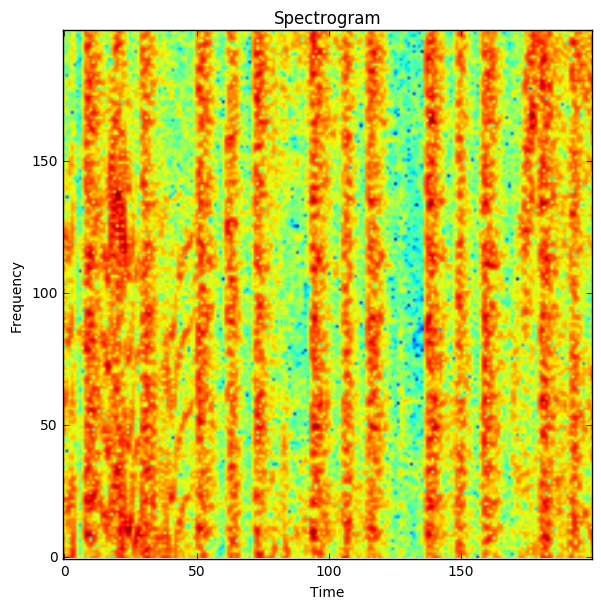

In [418]:
plot_spectrogram(spectrogram[800:1000, 800:1000])

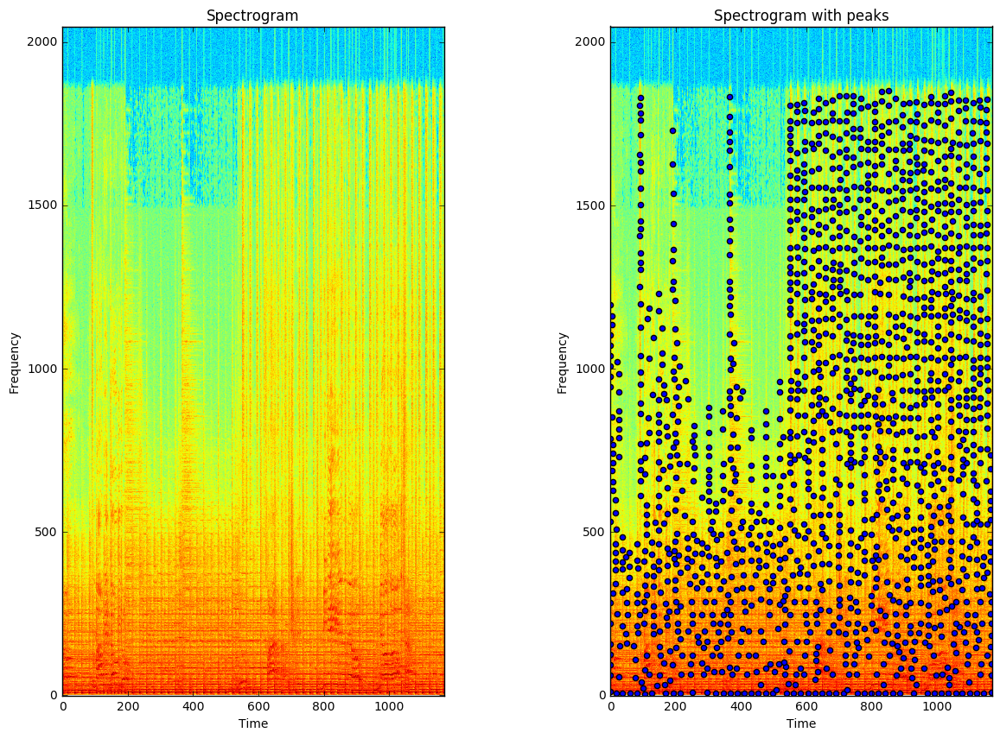

In [415]:
plot_spectrograms(spectrogram, t_unsharp7_g, f_unsharp7_g)

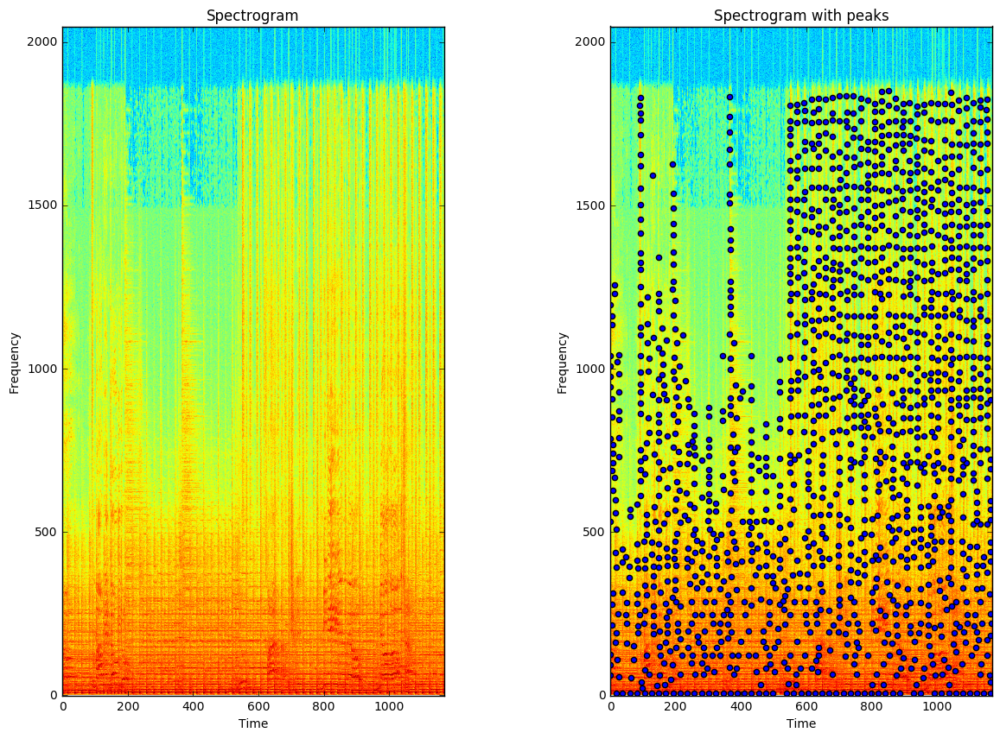

In [371]:
plot_spectrograms(spectrogram, t_nofilt, f_nofilt)

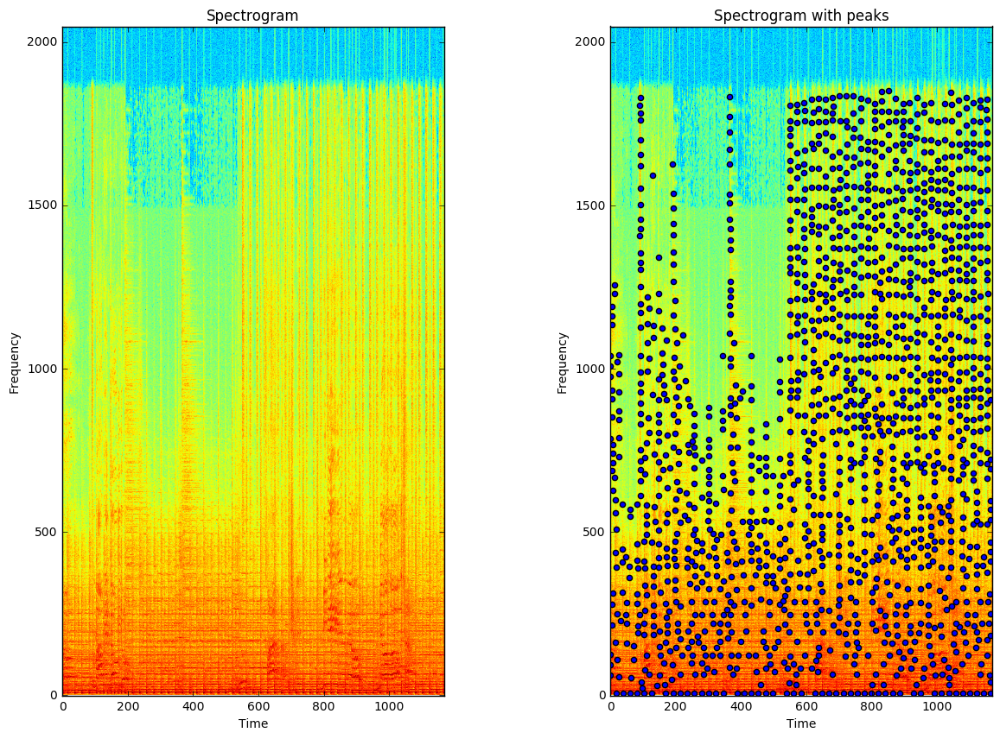

In [364]:
plot_spectrograms(spectrogram, t_lapl_2, f_lapl_2)

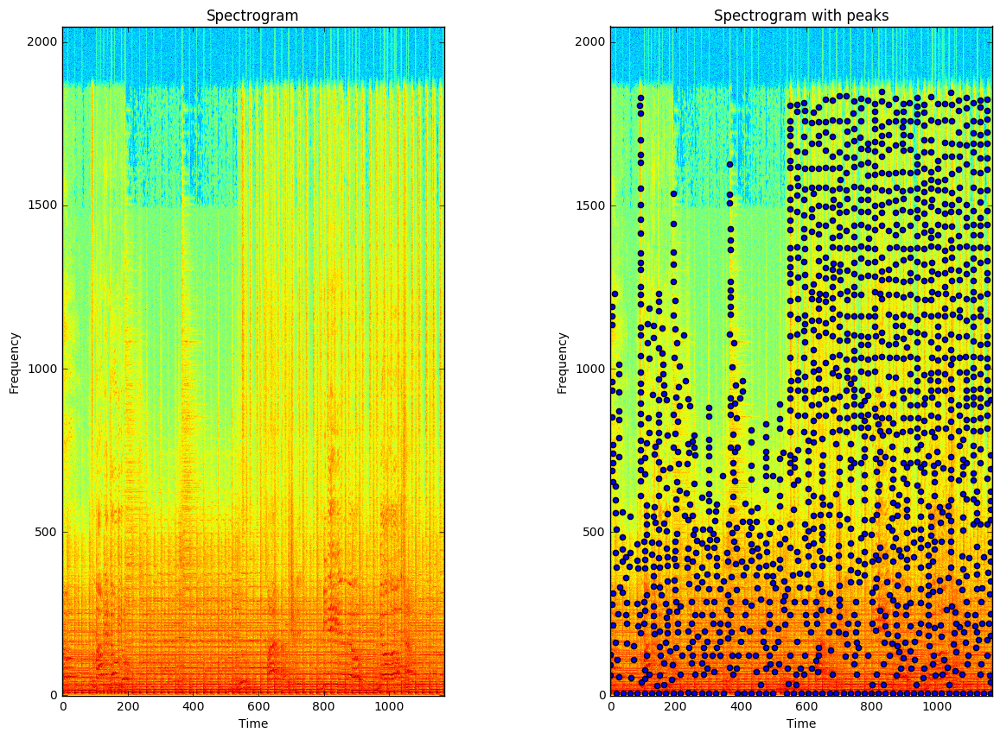

In [358]:
plot_spectrograms(spectrogram, t_lapl, f_lapl)

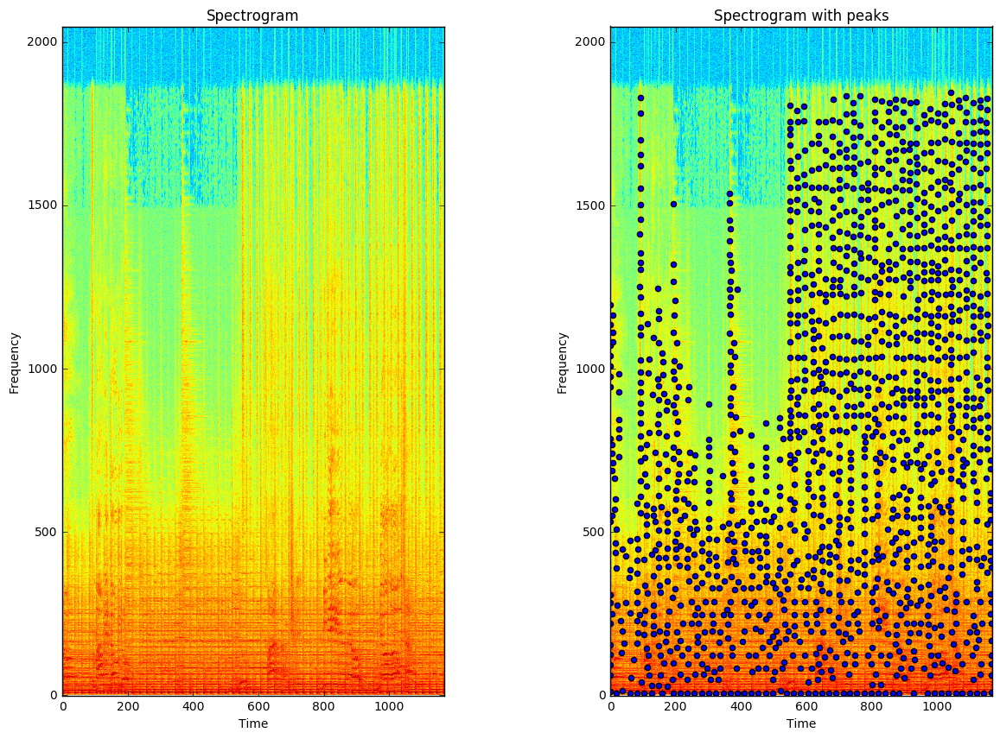

In [336]:
plot_spectrograms(spectrogram, t_unsharp_3, f_unsharp3)

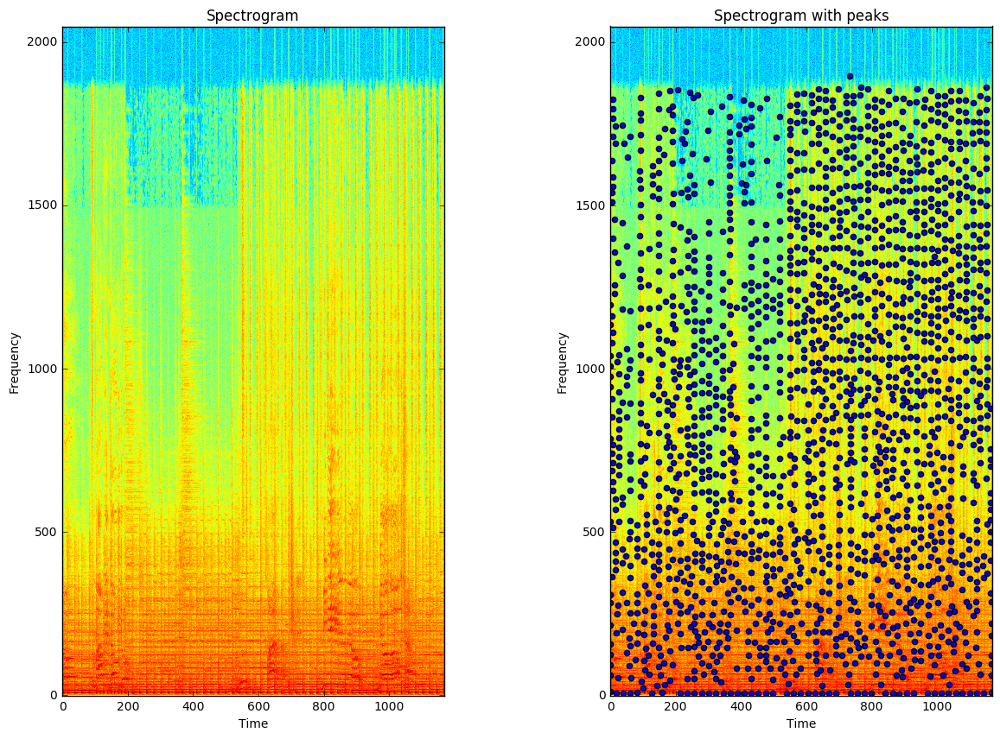

In [422]:
plot_spectrograms(spectrogram, t_unsharp7, f_unsharp7)

In [369]:
def plot_spectrograms(spectrogram, time_idx, frequency_idx):
    plt.figure(figsize=(15,10))
    # scatter of the peaks
    plt.subplot(121)
    plt.imshow(spectrogram)
    #ax.scatter(time_idx, frequency_idx)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.title("Spectrogram")
    plt.gca().invert_yaxis()

    plt.subplot(122)
    plt.imshow(spectrogram)
    plt.scatter(time_idx, frequency_idx)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.xlim(0, len(spectrogram[0]))
    plt.ylim(0, len(spectrogram))
    plt.title("Spectrogram with peaks")
#     plt.gca().invert_yaxis()

    plt.show()

In [23]:
def plot_spectrogram(arr2D):
    plt.figure(figsize=(15,10))
    # scatter of the peaks
    plt.subplot(121)
    plt.imshow(arr2D)
    #ax.scatter(time_idx, frequency_idx)
    plt.xlabel('Time')
    plt.ylabel('Frequency')
    plt.title("Spectrogram")
    plt.gca().invert_yaxis()